# Libreria Pillow (PILL)

La libreria Pillow (Pill) permite leer imágenes en formatos .png, .jpeg y .pdf; veamos:

In [1]:
import PIL

In [2]:
PIL.__version__

'10.3.0'

In [62]:
from PIL import Image, ImageDraw, ImageFont
image = Image.open('Gym.png')
import inspect
inspect.getmro(type(image))

(PIL.PngImagePlugin.PngImageFile,
 PIL.ImageFile.ImageFile,
 PIL.Image.Image,
 object)

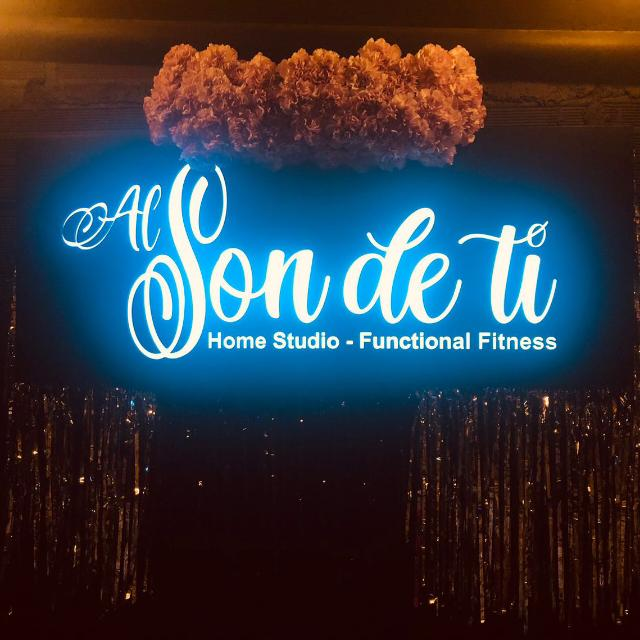

In [4]:
display(image)

## Algunas funciones importantes de PIL

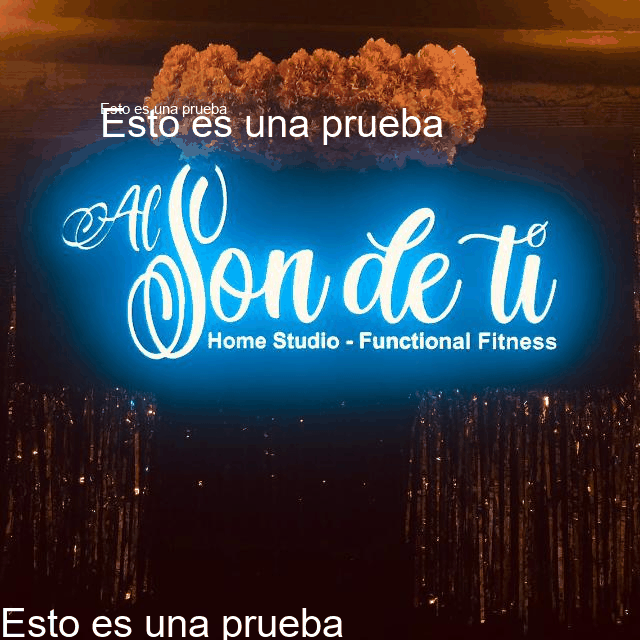

In [59]:
# Guardado
image.save('Prueba_imagen.gif')
Image_2 = Image.open('Prueba_imagen.gif') # Permite guardar la imagen en el formato que se quiera
import inspect
inspect.getmro(type(Image_2))
display(Image_2)

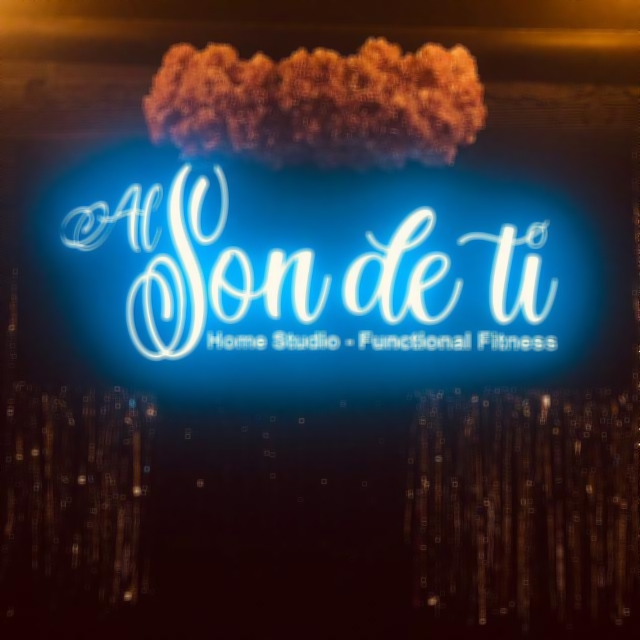

In [6]:
# Filtros 
# Paso 1: Convertir la imagen a un formato RGB
image = image.convert('RGB')
# Paso 2: Aplicar el filtro (Desenfoque)
from PIL import ImageFilter
blurred_image=image.filter(PIL.ImageFilter.BLUR)
display(blurred_image)

In [7]:
# Veamos el tamaño en pixeles de la imagen
print("{}x{}".format(image.width, image.height))

640x640


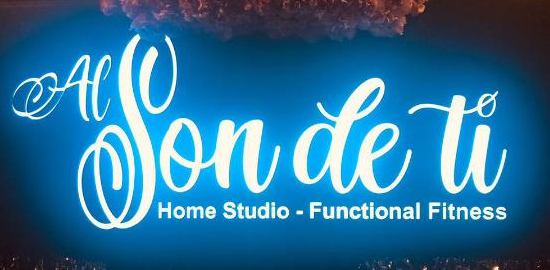

In [8]:
# Recortamos parte de la imagen: Se define la coordenada de la parte superior izquierda
# y la coordenada de la parte inferior derecha. La función a usar se llama crop
Im_3 = image.crop((50,130,600,400)) # Es posible asignarla a una nueva variable.
display(Im_3)

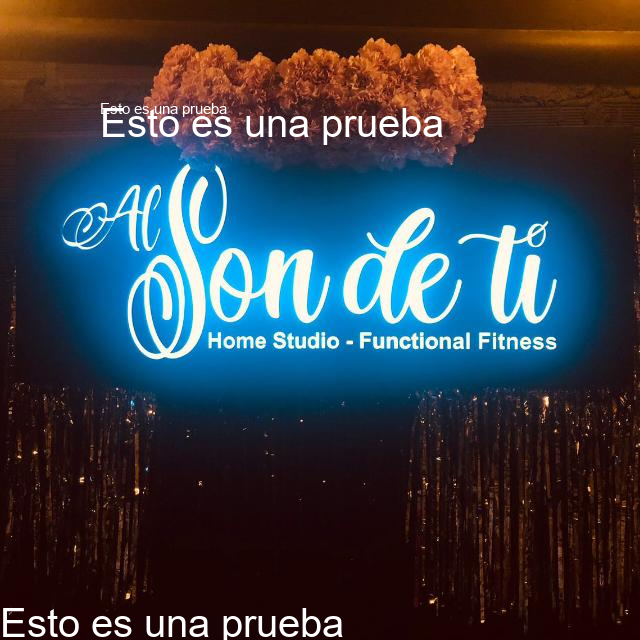

In [48]:
# Agregar un cuadro de color a una parte de la imagen, en general el método permite
# dibujar sobre la imagen
from PIL import ImageDraw
Im_4 = ImageDraw.Draw(image)
# Im_4.rectangle((50,130,600,400), fill=None, outline='blue')
font = ImageFont.truetype("arial.ttf", 40)
texto = 'Esto es una prueba'
Im_4.text((0,600), texto, font=font, fill=(255,255,255,0))
display(image)

### Otras funciones de PILLOW

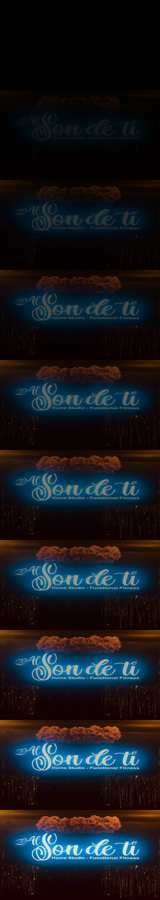

In [10]:
# Método que permite modificar el brillo de una imagen
from PIL import ImageEnhance
#Vamos a crear un bucle que genera 10 imágenes con brillo diferente. 
# El brillo es un parámetro que varía entre 0(negro sin brillo) y 1(todo el brillo)
im_5 = Image.open('Gym.png')
im_5 = im_5.convert('RGB')
im_6 = ImageEnhance.Brightness(im_5)
images = []
for i in range(10):
    images.append(im_6.enhance(i/10))

# Ahora crearemos una imagen que concatene verticalmente todas las imagenes
first_image= images[0]
contact_sheet = PIL.Image.new(first_image.mode, (first_image.width, 10*first_image.height))
y = 0 
for img in images:
    contact_sheet.paste(img,(0,y))
    y = y + 640

contact_sheet = contact_sheet.resize((160,900))
display(contact_sheet)

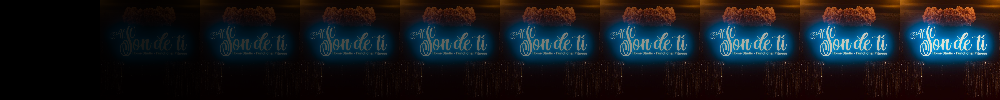

In [11]:
# Crearé una hoja de contacto horizontal


c_sh= PIL.Image.new(first_image.mode, (10*first_image.width, first_image.height))
x=0
for img in images:
    c_sh.paste(img, (x,0))
    x = x + 640
display(c_sh)

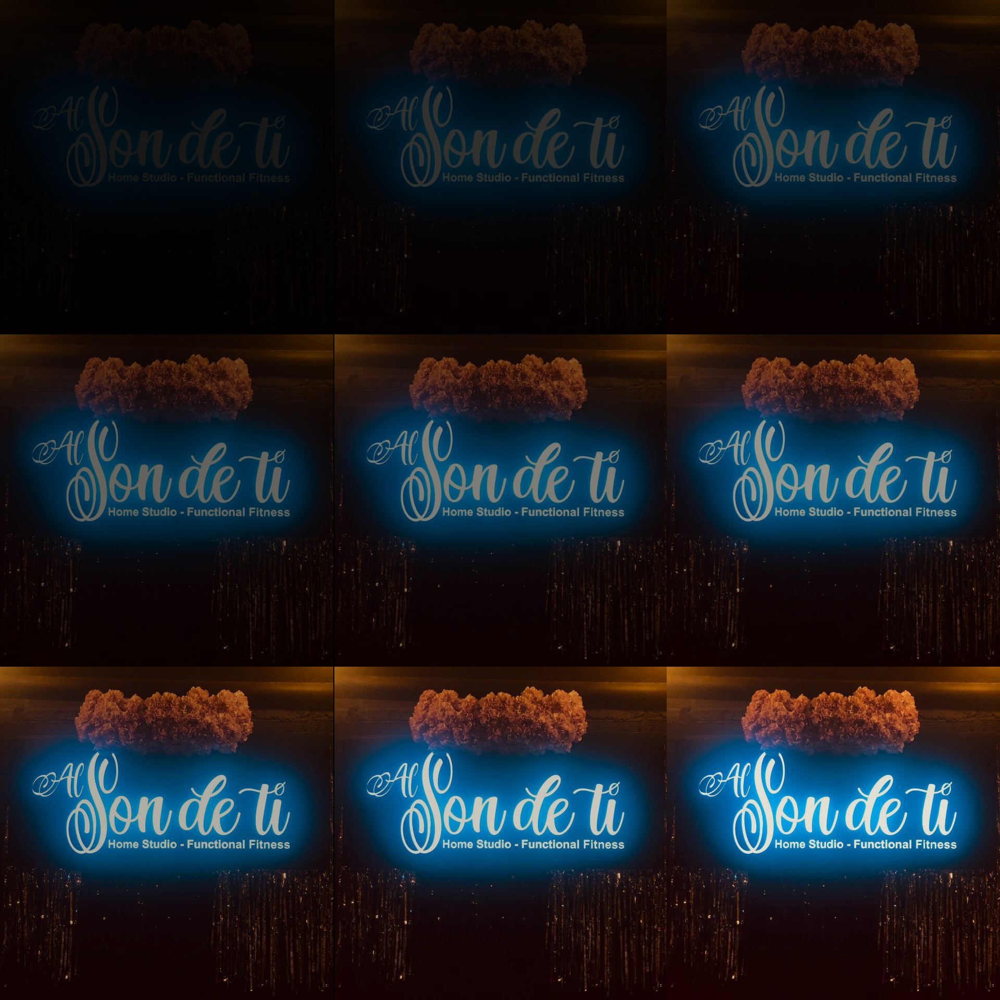

In [12]:
# Creemos una hoja de contacto de 9 imagenes
c_s9 = PIL.Image.new(first_image.mode,(3*first_image.width,3*first_image.height))
x = [0, 642, 640*2]
c = 1
for i in range(3):
    for j in range(3):
        c_s9.paste(images[c+j],(x[j],x[i]))
    c+=3
display(c_s9)


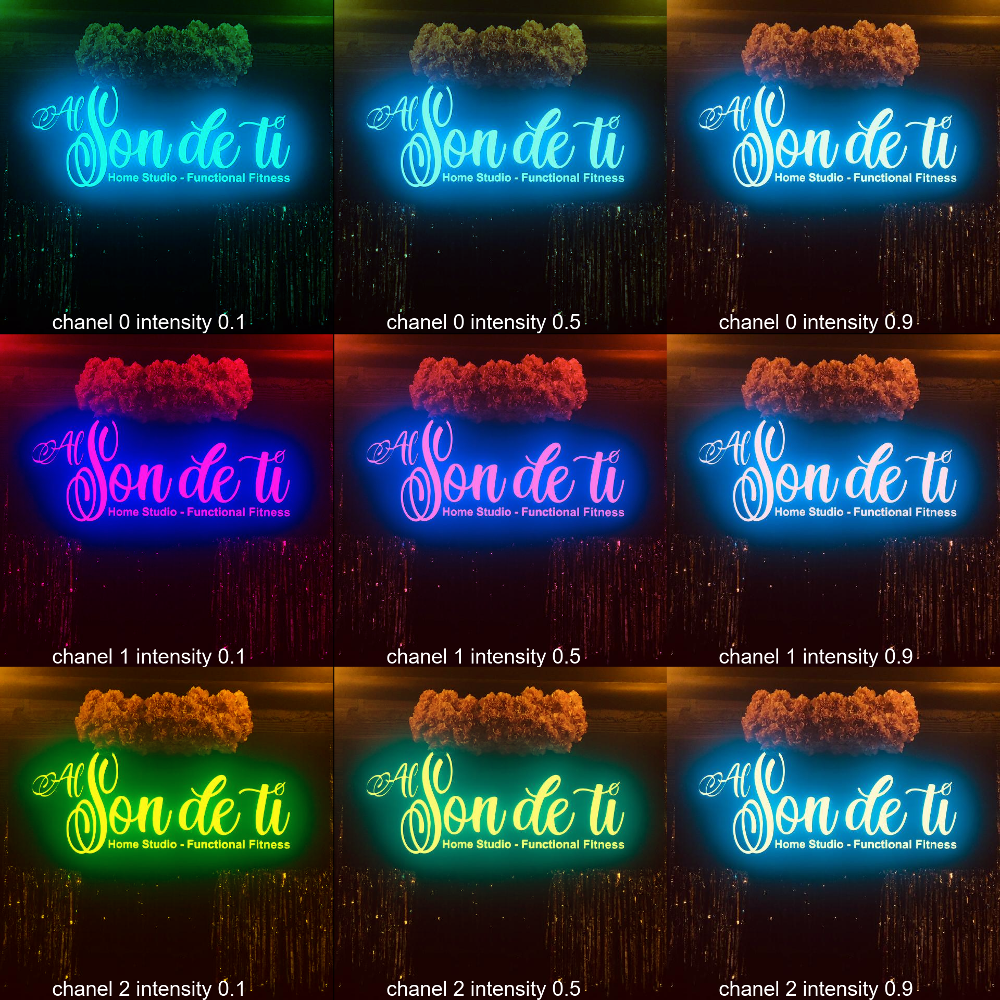

In [65]:
# Crearemos una función que permite modificar los pixeles de una imagen
p1 = PIL.Image.open('Gym.png')
p1 = p1.convert('RGB')
def trans_image(img,color,factor):
    picture_new = Image.new('RGB',(img.width, img.height))
    for x in range(img.width):
        for y in range(img.height):
            r,g,b = img.getpixel((x,y))
            if color == 'r':
                r = int(factor*r)
            elif color == 'g':
                g = int(factor*g)
            else:
                b = int(factor*b)
            picture_new.putpixel((x,y),(r,g,b))
    return picture_new

images_2 = []

factores = [0.1,0.5, 0.9]
colores = ['r', 'g', 'b']

for i in colores:
    for j in factores:
        im  = trans_image(image,i,j)
        im2 = ImageDraw.Draw(im)
        font = ImageFont.truetype("arial.ttf", 40)
        texto = 'chanel {} intensity {}'.format(colores.index(i), j)
        im2.text((100,p1.height-(40+5)), texto, font= font, fill=(255,255,255,0))
        images_2.append(im)

c_s92 = PIL.Image.new(first_image.mode,(3*first_image.width,3*first_image.height))
x = [0, 642, 640*2]
c = 0
for i in range(3):
    for j in range(3):
        c_s92.paste(images_2[c+j],(x[j],x[i]))
    c+=3
display(c_s92)
